In [1]:
import os
from dotenv import load_dotenv
from groq import Groq
import re
import random
from tqdm.auto import tqdm
import numpy as np
import torch
import pandas as pd
from time import perf_counter as timer
from langchain_text_splitters import HTMLSemanticPreservingSplitter

torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

In [2]:
load_dotenv()
api_key = os.getenv("keys")
print(api_key)

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


In [3]:
gpt4_questions = [
    "When was the University of Sharjah established, and under whose leadership?",
    "What is the vision and mission of the University of Sharjah?",
    "How many colleges does the University of Sharjah have, and how many academic programs does it offer?"
    "What are the admission requirements for undergraduate and graduate programs?",
    "What is the grading system and how is the GPA calculated at the University?",
    "What student support services are available, such as academic advising, counseling, and career services?",
    "What financial assistance options are available for students, and what are the methods for paying fees?",
    "What is the role of the Deanship of Student Affairs, and what services does it provide?",
    "What sports and extracurricular activities are available for students?",
    "What are the rules and consequences for academic dishonesty (cheating, plagiarism, etc.)?",
    "What healthcare services are available to students on campus?",
    "How does the transportation system work for students?",
    "What dining and food services are available at the university?",
    "What are the rules for using IT services and university electronic resources?",
    "What libraries and learning resources are available for students?"
]

<h2>Embedding our text chunks</h2>

In [ ]:
from sentence_transformers import SentenceTransformer
embedding_model = SentenceTransformer(model_name_or_path="multi-qa-mpnet-base-dot-v1", device="cuda")

# all-mpnet-base-v2
# * all-MiniLM-L6-v2
# multi-qa-mpnet-base-dot-v1
# multi-qa-MiniLM-L6-dot-v1
# multi-qa-mpnet-base-cos-v1
# multi-qa-MiniLM-L6-cos-v1
# paraphrase-multilingual-mpnet-base-v2 # for multilingual

<h2><b>RAG - Search and Answer</b></h2>

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
line_chunks_and_embedding_df = pd.read_csv("line_chunks_and_embeddings_df.csv")

print(line_chunks_and_embedding_df.columns)

Index(['line_data', 'line_char_count', 'line_word_count', 'embedding'], dtype='object')


In [6]:
print(line_chunks_and_embedding_df['embedding'].shape)
print(type(line_chunks_and_embedding_df['embedding'][0]))# text_chunks_and_embedding_df['embedding']
line_chunks_and_embedding_df['embedding'][0]

(318516,)
<class 'str'>


'[ 2.21107334e-01 -1.37587547e-01 -2.43935749e-01 -6.90197125e-02\n -1.89674765e-01  9.60879326e-02  1.91898122e-01  1.58027276e-01\n -1.82864591e-01  2.78814763e-01 -9.82174650e-03  1.66048687e-02\n  9.49929580e-02  4.57050512e-03  2.72980868e-03  1.69167429e-01\n  2.25522131e-01  6.08836673e-02 -2.89299004e-02 -9.67593491e-02\n -1.68070734e-01  3.00486743e-01 -2.00210497e-01 -1.89606678e-02\n  6.03698492e-02  3.52069102e-02 -1.40278721e-02 -1.05841383e-02\n -2.21510053e-01 -1.38940752e-01  1.31627247e-02  1.00609608e-01\n -2.79136837e-01 -5.87857105e-02 -1.08695662e-04 -1.41751245e-01\n  1.76953092e-01 -2.08931118e-02 -2.24300593e-01 -1.99794620e-01\n -1.74917862e-01  3.23043883e-01 -1.94262445e-01 -3.29123497e-01\n -1.47573799e-01  1.86037600e-01  8.79937112e-02 -1.29229546e-01\n -7.72467852e-02  3.51110667e-01  2.79381722e-01 -3.18288863e-01\n -2.42868111e-01 -1.45059913e-01  2.58321073e-02  2.97342807e-01\n -1.72739029e-01  1.38099089e-01  2.61573553e-01  3.27436894e-01\n  9.32948

In [7]:
def convert_to_array(x):
    if isinstance(x, str):  # If stored as string, convert to np.ndarray
        return np.fromstring(x.strip("[]"), sep=" ")
    return x  # If already an array, return as is


In [8]:
# Convert embedding column back to np.ndarray then tensor
line_chunks_and_embedding_df["embedding"] = line_chunks_and_embedding_df["embedding"].apply(lambda x:convert_to_array(x))
embeddings = torch.tensor(np.stack(line_chunks_and_embedding_df["embedding"].tolist(), axis=0), dtype=torch.float32).to(device)

In [9]:
print(type(line_chunks_and_embedding_df["embedding"][0])) # it is converted from "str" to "numpy.ndarray"
print(embeddings.shape)
line_chunks_and_embedding_df

<class 'numpy.ndarray'>
torch.Size([318516, 768])


,line_data,line_char_count,line_word_count,embedding
0,metadata: Computer-Science ||content:[English]...,182,9,"[0.221107334, -0.137587547, -0.243935749, -0.0..."
1,metadata: Computer-Science ||content:Directory...,148,2,"[0.154044315, 0.0474369861, -0.276545197, 0.01..."
2,metadata: Computer-Science ||content:Degrees](...,165,5,"[0.169586778, -0.0751662031, -0.281580627, -0...."
3,metadata: Computer-Science ||content:Stories](...,249,3,"[0.0791465044, 0.0789134353, -0.342015684, -0...."
4,metadata: Computer-Science ||content:[For Stud...,178,6,"[0.20807904, -0.267915934, -0.231116161, -0.00..."
...,...,...,...,...
318511,metadata: lab-article: ||content:chemoattract...,224,12,"[0.0304656401, -0.653361201, -0.153777897, -0...."
318512,metadata: lab-article: ||content:factor-A. Bl...,243,21,"[0.10087768, -0.55556488, -0.096543774, -0.115..."
318513,metadata: lab-article: ||content:mechanism an...,248,15,"[0.05196793, -0.770116448, -0.133820102, -0.26..."
318514,metadata: lab-article: ||content:Arterioscler...,213,13,"[0.060159523, -0.379575759, -0.221238345, -0.2..."


In [10]:
# Convert texts and embedding df to list of dicts
line_and_chunks = line_chunks_and_embedding_df.to_dict(orient="records")
line_and_chunks

[{'line_data': 'metadata: Computer-Science ||content:[English]() [عربي]() [Discover](https://www.sharjah.ac.ae/) [Why Computer Science](https://www.sharjah.ac.ae/en/Academics/CI/Computer-Science/Why-Computer-Science) [Faculty and Staff',
  'line_char_count': 182,
  'line_word_count': 9,
  'embedding': array([ 2.21107334e-01, -1.37587547e-01, -2.43935749e-01, -6.90197125e-02,
         -1.89674765e-01,  9.60879326e-02,  1.91898122e-01,  1.58027276e-01,
         -1.82864591e-01,  2.78814763e-01, -9.82174650e-03,  1.66048687e-02,
          9.49929580e-02,  4.57050512e-03,  2.72980868e-03,  1.69167429e-01,
          2.25522131e-01,  6.08836673e-02, -2.89299004e-02, -9.67593491e-02,
         -1.68070734e-01,  3.00486743e-01, -2.00210497e-01, -1.89606678e-02,
          6.03698492e-02,  3.52069102e-02, -1.40278721e-02, -1.05841383e-02,
         -2.21510053e-01, -1.38940752e-01,  1.31627247e-02,  1.00609608e-01,
         -2.79136837e-01, -5.87857105e-02, -1.08695662e-04, -1.41751245e-01,
      

<h2>Now, Let's create a small semantic search pipeline.<h2>

In [11]:
from sentence_transformers import util, SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

embedding_model = SentenceTransformer(model_name_or_path="multi-qa-mpnet-base-dot-v1", device=device)

<b>lets test our retrival part==============================</b>

In [12]:
import textwrap

def print_wrapped(text, wrap_length=80):
    wrapped_text = textwrap.fill(text, wrap_length)
    print(wrapped_text)

In [13]:
queryTest1 = random.choice(gpt4_questions)

queryTest1_embedding = embedding_model.encode(queryTest1, convert_to_tensor=True).to("cuda")

start_time = timer()
dot_scores = util.dot_score(a=queryTest1_embedding, b=embeddings)[0] 
end_time = timer()
print(f"[INFO] Time taken to get scores on {len(embeddings)} embeddings: {end_time-start_time:.5f} seconds.")
top_results_dot_product = torch.topk(dot_scores, k=5)
print(top_results_dot_product) 

print(f"\nQuery: '{queryTest1}'\n")
print("Results:")

for probabilityScore, line_index_number in zip(top_results_dot_product[0], top_results_dot_product[1]): # zip(top_results_dot_product.values.cpu().numpy(), top_results_dot_product.indices.cpu().numpy()): 
    print(f"Score: {probabilityScore:.4f}")
    
    print("Output Text:")
    print("Line number: ", line_index_number)
    print_wrapped(line_and_chunks[line_index_number]["line_data"])
    print("\n")

[INFO] Time taken to get scores on 318516 embeddings: 0.00752 seconds.
torch.return_types.topk(
values=tensor([23.6054, 22.9243, 22.4393, 22.2339, 22.2339], device='cuda:0'),
indices=tensor([ 10875,  11652, 262006, 295063, 220089], device='cuda:0'))

Query: 'What student support services are available, such as academic advising, counseling, and career services?'

Results:
Score: 23.6054
Output Text:
Line number:  tensor(10875, device='cuda:0')
metadata: Student-Success-Center ||content:nurturing well-rounded individuals,
equipping you with the skills needed for success in both university studies and
life beyond. Our resources, available through the Student Support Office and the
Personal and Social Advising Office, aim to empower


Score: 22.9243
Output Text:
Line number:  tensor(11652, device='cuda:0')
metadata: Overview-Details ||content:the Deanship of Academic Support Services
at the University of Sharjah. The department is considered the students' gateway
to academic life, from th

<b>==============================</b>

In [14]:
def retrieve_relevant_resources(query:str, embeddings:torch.tensor, model:SentenceTransformer=embedding_model, n_resources_to_return: int=5, print_time: bool=True):
    query_embedding = model.encode(query, convert_to_tensor=True)
    
    start_time = timer()
    dot_scores = util.dot_score(query_embedding, embeddings)[0]
    end_time = timer()

    if print_time:
        print(f"[INFO] Time taken to get scores on ({len(embeddings)} embeddings: {end_time-start_time:.5f} seconds.")

    scores, indices = torch.topk(input=dot_scores,k=n_resources_to_return)
    return scores, indices 

In [15]:
def print_top_results_and_scores(query: str, embeddings: torch.tensor, pages_and_chunks: list[dict]=line_and_chunks, n_resources_to_return: int=5):

    scores, indices = retrieve_relevant_resources(query=query, 
                                                  embeddings=embeddings, 
                                                  n_resources_to_return=n_resources_to_return)

    for score, idx in zip(scores, indices):
        print(f"Score: {score:.4f}")
        print("Text:")
        print_wrapped(line_and_chunks[idx]["line_data"])
        print("\n")

In [16]:
print_top_results_and_scores(
    query = random.choice(gpt4_questions), 
    embeddings = embeddings
)

[INFO] Time taken to get scores on (318516 embeddings: 0.00015 seconds.
Score: 27.8621
Text:
metadata: Overview-Details ||content:Sharjah’s mission and community service
objectives by leading change in health professions education. Mission: To foster
a culture of collaboration and scholarly endeavors that lead to high-quality
teaching and learning in the field of health


Score: 27.8074
Text:
metadata: Department-Overview ||content:you rate your experience with our
website? Submit Department Overview Mission : The mission of the Research
Funding Department is to implement the vision of the University of Sharjah in
promoting distinguished, high-standard research. Goal : The


Score: 27.6156
Text:
metadata: President ||content:involved with its growth and progress. The
University of Sharjah is indeed a vision realized, a true hub of knowledge and
education and a beacon of opportunity for scholars, researchers, and all those
whose choose to pursue education and success –


Score: 27.4889


<h2><b>Define Groq => llama3-70B model</b></h2> 

In [109]:
def summerizePrompt(basePrompt:str, temperature:float=1.0, max_completion_tokens:int=1024, top_p:float=1.0, stream:bool=True):
    client = Groq(api_key=api_key)
    completion = client.chat.completions.create(
        model="mistral-saba-24b",
        # llama-3.3-70b-versatile   deepseek-r1-distill-llama-70b   llama-3.1-8b-instant    llama3-70b-8192  mistral-saba-24b
        messages=[
            {
                "role": "system",
                "content":  (
                    "Create answer of user query from the given iser base prompt and ignore the non-related part in the given content"
                    "Rewrite the following passage in a structured human-like manner. "
                    "Remove all asterisks and symbols and replace them with numbers else where appropriate."
                )
            },
            {
                "role": "user",
                "content": basePrompt
            }
        ],
        temperature=1,
        max_completion_tokens=max_completion_tokens,
        top_p=top_p,
        stream=stream,
        stop=None,
    )
    
    
    data = ""
    for chunk in completion:
        data += chunk.choices[0].delta.content or ""
    return data

<h2><b>Augmenting our prompt with context items with prompt engineering</b></h2> 

In [111]:
def prompt_formatter(query: str, context_items: list[dict]) -> str:
        context = "- " + "\n- ".join([item["line_data"] for item in context_items])
        #print(context)
        base_prompt = """ 
        Context: {context} 
        User query: {query}
        Answer:
        """ 
        
        base_prompt = base_prompt.format(context=context, query=query)

        return base_prompt

In [112]:
def ask(query: str, temperature: float=0.3, max_new_tokens:int=256, return_answer_only=True):
    scores, indices = retrieve_relevant_resources(query=query, embeddings=embeddings, n_resources_to_return=10)
    print("Scores: ", scores)
    context_items = [line_and_chunks[i] for i in indices] 
    
    for i, item in enumerate(context_items): 
        item["score"] = scores[i].cpu() 

    # Augment ans
    prompt = prompt_formatter(query=query, context_items=context_items)
    
    #Generating / optimizing ans
    output_text = summerizePrompt(basePrompt=prompt, temperature=temperature, max_completion_tokens=max_new_tokens)
    # output_text = output_text.split("</think>")[1]
    
    if return_answer_only:
        return output_text

    return output_text, [item["line_data"] for item in context_items]

In [113]:
query = random.choice(gpt4_questions)
print(f"Query: {query}")

outputAns, contextItems = ask(query="give me the link of study plan Accounting degree?", temperature=1, max_new_tokens=2048, return_answer_only=False)
print(outputAns)
print(contextItems)

Query: What is the vision and mission of the University of Sharjah?
[INFO] Time taken to get scores on (318516 embeddings: 0.00009 seconds.
Scores:  tensor([25.8742, 25.8742, 25.8742, 25.8742, 25.8742, 23.4516, 23.4127, 23.4127,
        23.4127, 23.4127], device='cuda:0')
You can find the study plan for the Accounting degree by clicking the following link:

[Accounting Study Plan](https://api.sharjah.ac.ae/-/media/project/uos/sites/uos/academics/degrees/business/accounting_-study-plan.pdf)

Do you need any more information?
['metadata: accounting ||content:[](https://api.sharjah.ac.ae/-/media/project/uos/sites/uos/academics/degrees/business/accounting_-study-plan.pdf) Study Plan for Accounting What You Will Learn By pursuing an accounting degree, you will develop skills in budgeting, forecasting and', 'metadata: Accounting ||content:[](https://api.sharjah.ac.ae/-/media/project/uos/sites/uos/academics/degrees/business/accounting_-study-plan.pdf) Study Plan for Accounting What You Will L

<h1>Read EvalSet.txt file and get 20 question and get context and answer</h1>

In [114]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from matplotlib import pyplot as plt

with open("evalSet.txt", "r", encoding="utf-8") as f: 
    qData = f.readlines()

print(len(qData))
print(random.choice(qData))

148
what is the course structure for 1st year in Bachelor of Science in Physiotherapy? 



In [115]:
def getQuestions(numQuestion=20 , questions=qData): 
    tempQuestion = []
    op = 0
    while True: 
        qn = random.choice(questions)
        if qn not in tempQuestion: 
            tempQuestion.append(qn.split("\n")[0])
            op+=1
        else: 
            continue
        if op==numQuestion: 
            break
    return tempQuestion

questn = getQuestions(20 , qData)

In [116]:
qCt = []
qAns = []

for q in questn: 
    outputAns, contextItems = ask(query=q , temperature=1, max_new_tokens=2048, return_answer_only=False)
    qAns.append(outputAns)
    qCt.append(contextItems)

[INFO] Time taken to get scores on (318516 embeddings: 0.00006 seconds.
Scores:  tensor([25.4986, 24.8162, 24.6970, 24.5158, 24.2899, 23.9826, 23.9826, 23.7485,
        23.7485, 23.1337], device='cuda:0')
[INFO] Time taken to get scores on (318516 embeddings: 0.00006 seconds.
Scores:  tensor([27.9007, 27.9007, 27.9007, 27.9007, 26.6782, 26.6782, 26.6782, 26.6782,
        26.2244, 26.2244], device='cuda:0')
[INFO] Time taken to get scores on (318516 embeddings: 0.00005 seconds.
Scores:  tensor([26.7317, 26.7317, 26.7317, 26.7317, 26.5201, 26.3024, 26.3024, 26.3024,
        26.3024, 26.1454], device='cuda:0')
[INFO] Time taken to get scores on (318516 embeddings: 0.00007 seconds.
Scores:  tensor([25.4560, 25.4560, 25.4560, 25.4560, 25.3733, 25.3733, 25.3729, 25.3729,
        25.2612, 25.2612], device='cuda:0')
[INFO] Time taken to get scores on (318516 embeddings: 0.00006 seconds.
Scores:  tensor([23.1830, 22.9518, 22.9507, 22.9507, 22.7584, 22.7154, 22.5636, 22.4018,
        22.3147, 22

<h3>Quantitative Eval: F1, recall, precission with ==>> Same Embadding Model</h3>

In [117]:
def visualizeFucn(questn, qCt, qAns):
    ctSimilarityAll = []
    ansSimilarityAll = []
    for x in range(len(questn)):
        ctSimilarity = []
        
        questEmbd = embedding_model.encode(questn[x]).reshape(1, -1)
        ansEmbd = embedding_model.encode(qAns[x]).reshape(1, -1)
        
        Q_A_similarity = cosine_similarity(questEmbd, ansEmbd)[0]
        ansSimilarityAll.append(Q_A_similarity[0])
        
        for y in range(len(qCt[x])): 
            ctEmbd = embedding_model.encode(qCt[x][y]).reshape(1, -1)
            Q_CT_Similaruty = cosine_similarity(questEmbd, ctEmbd)
            ctSimilarity.append(Q_CT_Similaruty[0][0])
            
        ctSimilarity = sorted(ctSimilarity, reverse=True)
        ctSimilarityAll.append(ctSimilarity)

    return ctSimilarityAll, ansSimilarityAll

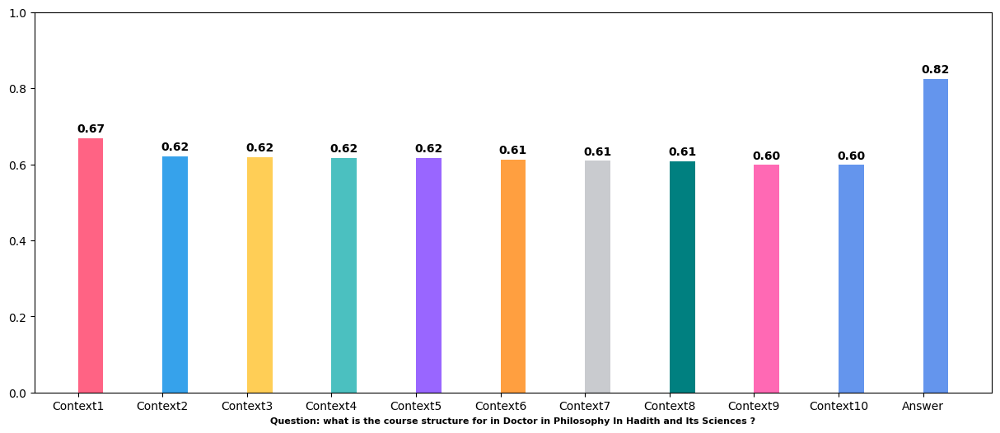

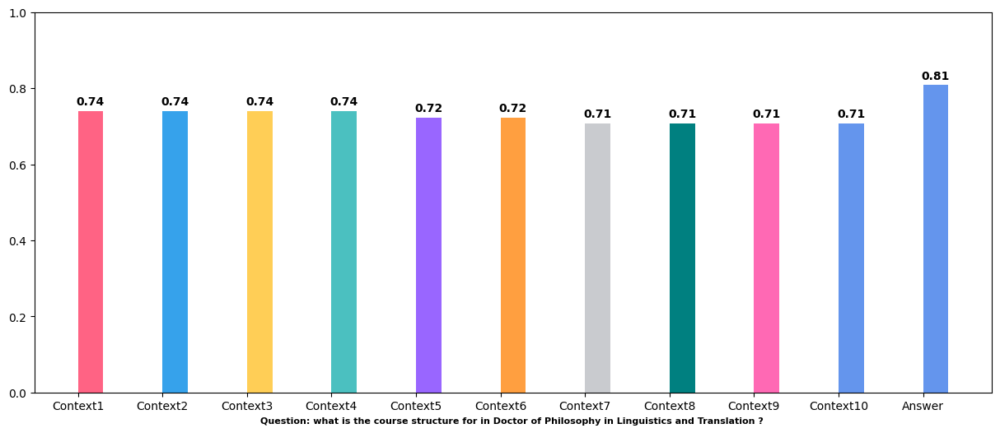

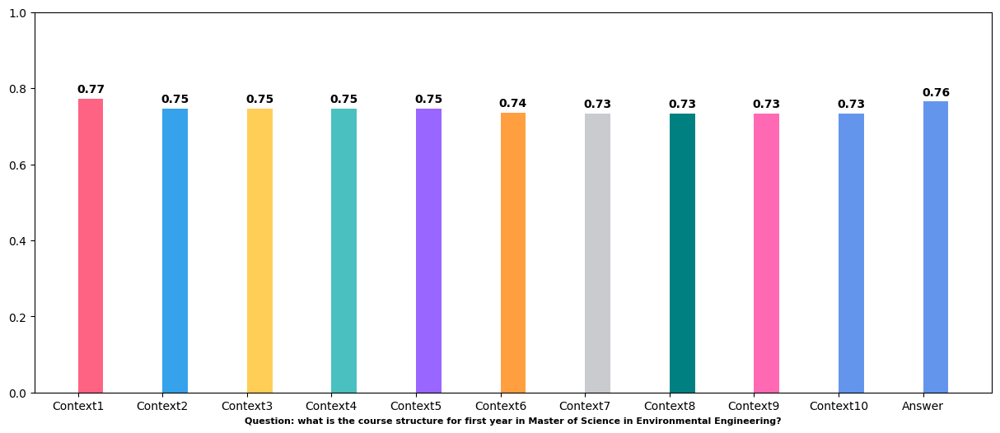

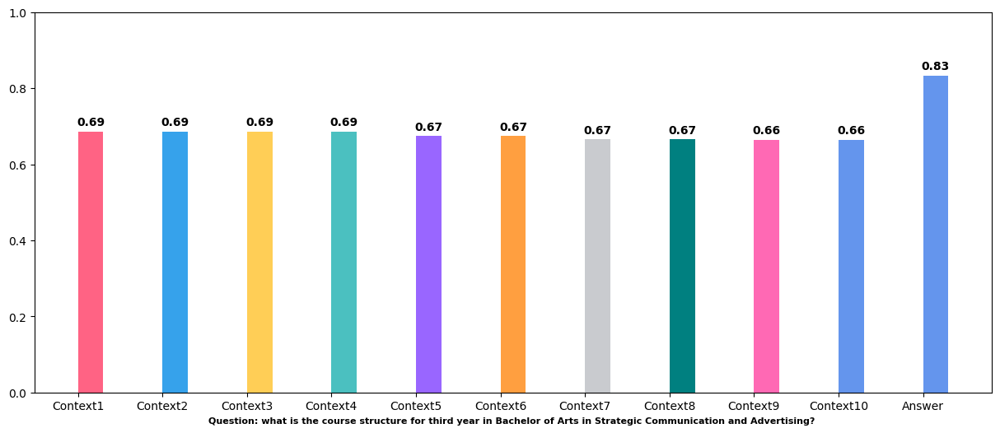

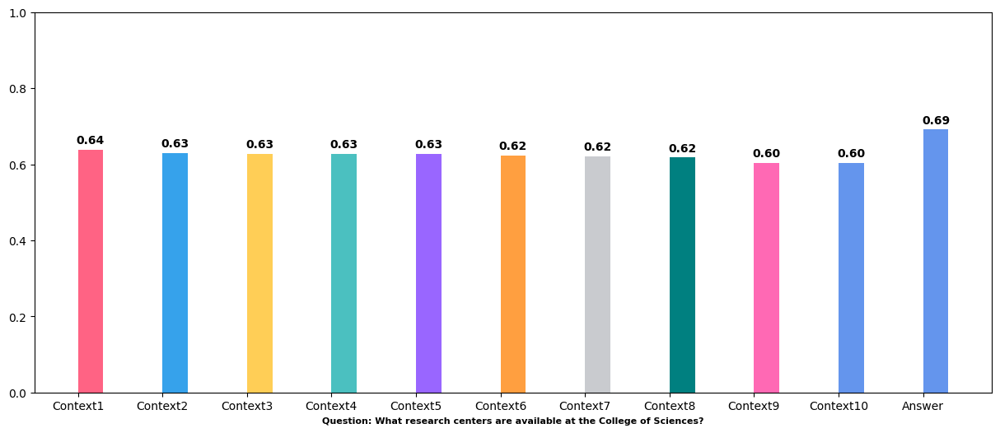

...

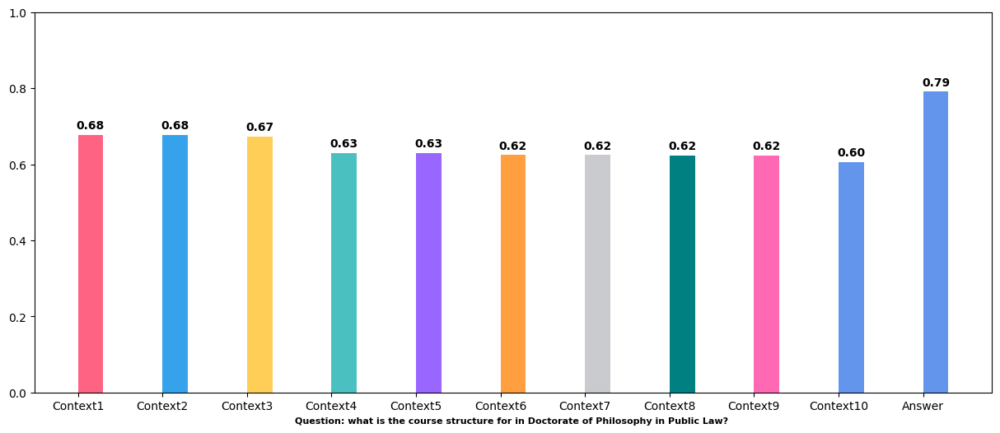

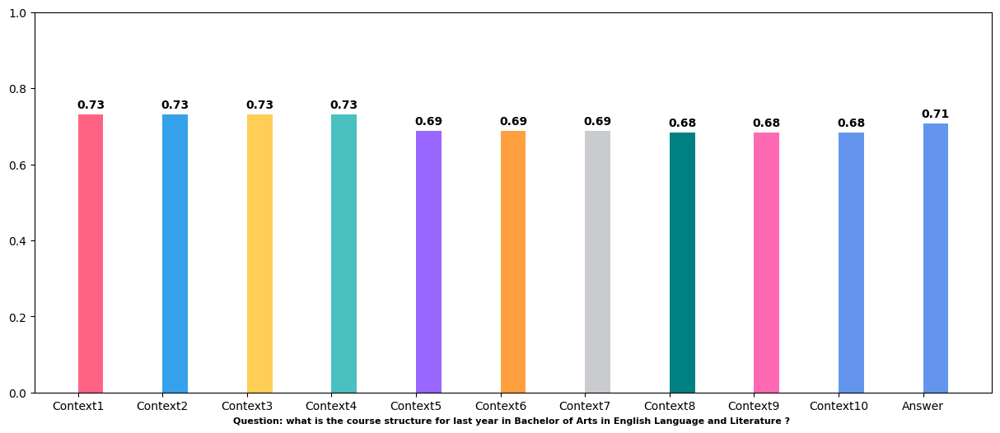

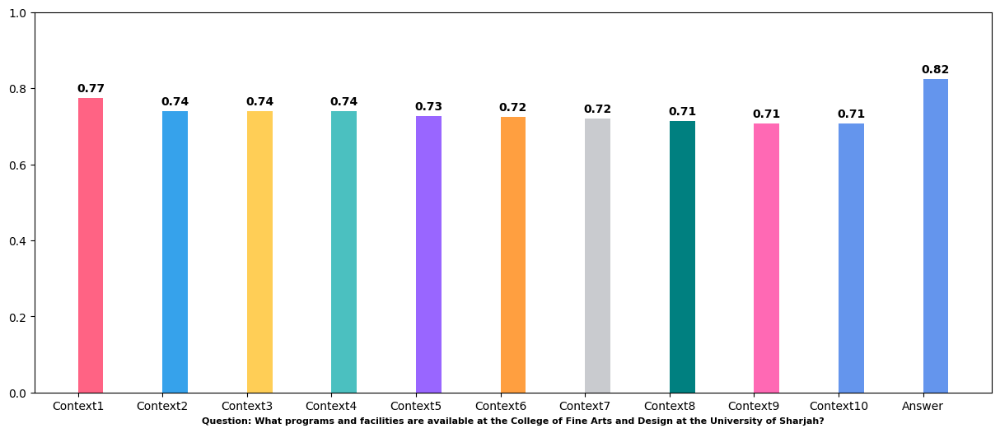

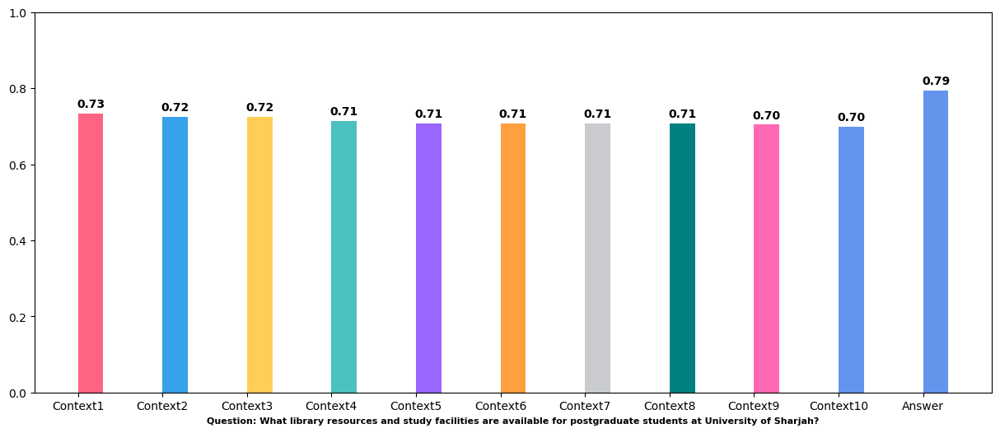

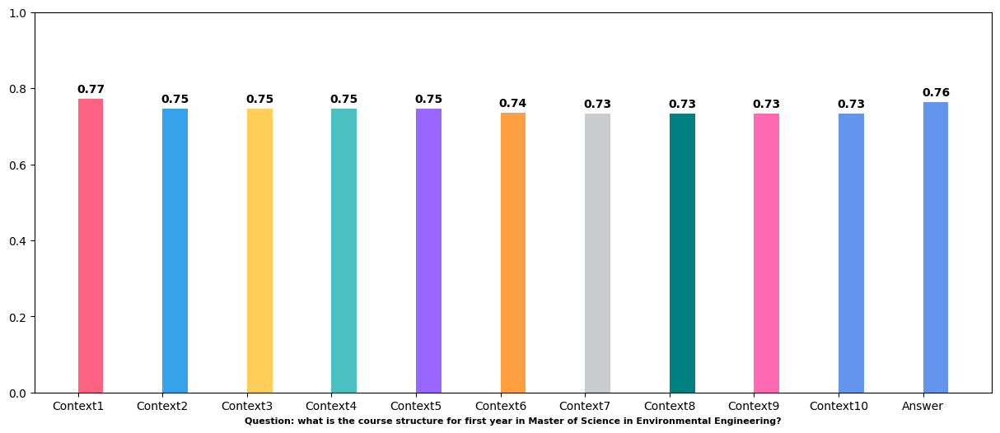

In [118]:
ctSimilarityAll , Q_A_similarity = visualizeFucn(questn, qCt, qAns)

def contextualVisualize(ctxArrTemp, q_a_ArrTemp): 
    x = ["Context"+str(x+1) for x in range(len(ctxArrTemp[0]))]
    x.append("Answer")

    
    for ctx in range(len(ctxArrTemp)):
         
        ctxArrTemp[ctx].append(q_a_ArrTemp[ctx])
        plt.figure(figsize=(15, 6))
        plt.ylim(0, 1.0)
        
        bars = plt.bar(
            x,
            ctxArrTemp[ctx],
            width=0.3,
            align="edge" ,
            alpha=1.0,
            color = [
                (1.0, 0.388, 0.518, 1.0),
                (0.212, 0.635, 0.922, 1.0),
                (1.0, 0.808, 0.337, 1.0),
                (0.294, 0.753, 0.753, 1.0),
                (0.6, 0.4, 1.0, 1.0),
                (1.0, 0.624, 0.251, 1.0),
                (0.788, 0.796, 0.812, 1.0),
                (0.0, 0.502, 0.502, 1.0),
                (1.0, 0.412, 0.706, 1.0),
                (0.392, 0.584, 0.929, 1.0),
                (0.392, 0.584, 0.929, 1.0)
            ],
            label=questn[ctx],
            edgecolor=(0, 0, 0, 1.0),
            linewidth=5,
            linestyle="none"
        )
        
        for bar in bars:
            height = bar.get_height()
            plt.text(
                bar.get_x() + bar.get_width() / 2.0,
                height + 0.01,  
                f"{height:.2f}", 
                ha='center',
                va='bottom',
                fontsize=10,
                fontweight='bold'
            )
        plt.xlabel(f"Question: {questn[ctx]}", fontsize=8, fontweight='bold')
        plt.show()
    
contextualVisualize(ctSimilarityAll, Q_A_similarity)